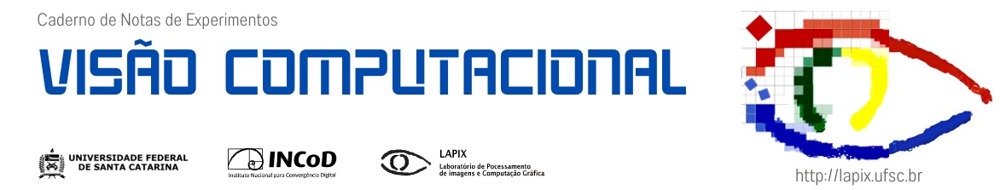






<a href="https://colab.research.google.com/github/awangenh/vision/blob/master/jupyter/02.1.Dom%C3%ADnios%20do%20Valor%20e%20Espa%C3%A7o%20-%20Detector%20de%20Carros.ipynb"><img align="left"  src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open in Colab" title="Open and Execute in Google Colaboratory"></a>&nbsp; &nbsp;<a href=""><img align="left" src="http://www.lapix.ufsc.br/wp-content/uploads/2019/04/License-CC-BY-ND-4.0-orange.png" alt="Creative Commons 4.0 License" title="Creative Commons 4.0 License"></a>&nbsp; &nbsp; <a href=""><img align="left" src="http://www.lapix.ufsc.br/wp-content/uploads/2019/04/Jupyter-Notebook-v.1.0-blue.png" alt="Jupyter Version" title="Jupyter Version"></a>&nbsp; &nbsp;<a href=""><img align="left"  src="https://img.shields.io/badge/python-3.10-green" alt="Python Version" title="Python Version"></a>

#  Sistema para Contagem de Sacos de Cimento







# Célula 1: Configuração e Preparação do Ambiente (Estrutural)


In [ ]:
# 1. Instalação de bibliotecas (Adicionando ipywidgets e scikit-image)
!pip install opencv-python numpy scikit-image ipywidgets

# 2. Importação das bibliotecas
import cv2
import numpy as np
from google.colab import drive
import os
import time
import matplotlib.pyplot as plt
from skimage.filters import threshold_otsu # Necessário para Célula 4
from skimage import img_as_ubyte # Necessário para Célula 4
from ipywidgets import interactive # Necessário para Célula 4
from IPython.display import display # Necessário para Célula 4 e 7

# 3. Montagem do Google Drive
drive.mount('/content/drive')

# 4. Definição do caminho do vídeo
video_path = '/content/drive/My Drive/Filipe_visao_comp/pac.mp4'

# 5. Verificação do ficheiro
if not os.path.exists(video_path):
    print("Erro: O ficheiro de vídeo não foi encontrado. Verifique o caminho.")
else:
    print("Ficheiro de vídeo encontrado. Pronto para processar.")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 26.6 MB/s eta 0:00:00
Mounted at /content/drive
Ficheiro de vídeo encontrado. Pronto para processar.


# Célula 2: Análise Estática do Quadro Inicial (RGB e Escala de Cinza)
### Objetivo: Obter a imagem de entrada e entender suas características.

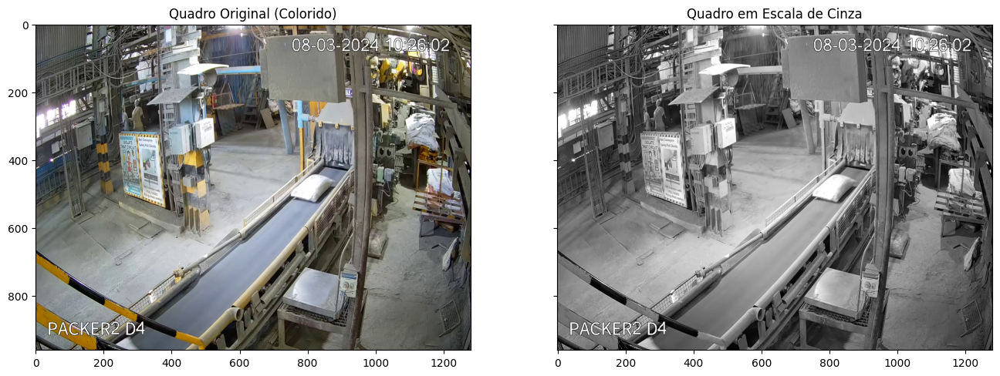

In [ ]:
if 'video_path' not in locals():
    print("Erro: A variável 'video_path' não está definida. Execute a Célula 1.")
else:
    # 1. Cria um objeto de captura de vídeo e lê o primeiro quadro
    cap = cv2.VideoCapture(video_path)
    ret, frame = cap.read()
    cap.release() # Fecha o objeto imediatamente

    # 2. Variável global para ser usada na próxima célula
    global gray_frame

    if not ret:
        print("Erro: Não foi possível ler o quadro do vídeo. Verifique se o caminho está correto.")
    else:
        # 3. Converte para RGB e Escala de Cinza
        rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # 4. Exibe a imagem original e em escala de cinza
        fig, axes = plt.subplots(1, 2, figsize=(16, 8), sharex=True, sharey=True)
        ax = axes.ravel()
        ax[0].imshow(rgb_frame)
        ax[0].set_title("Quadro Original (Colorido)")
        ax[1].imshow(gray_frame, cmap='gray')
        ax[1].set_title("Quadro em Escala de Cinza")

        plt.show()

# Célula 3: Calibração Estática da Máscara (Limiarização Adaptativa e Abertura)

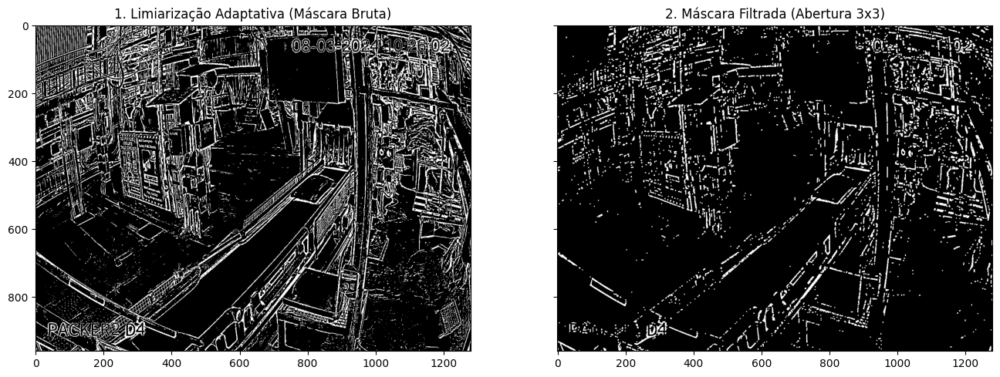

In [ ]:
if 'gray_frame' not in globals():
    print("Erro: 'gray_frame' não está disponível. Execute a Célula 2 primeiro.")
else:
    # --- Limiarização Adaptativa (Apenas para fins de calibração/análise) ---
    dst = cv2.adaptiveThreshold(gray_frame, 255,
                                 cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                 cv2.THRESH_BINARY_INV, 17, 10)

    # --- Abertura Morfológica para Ruído (Apenas para fins de calibração/análise) ---
    kernel = np.ones((3,3), np.uint8)
    opening = cv2.morphologyEx(dst, cv2.MORPH_OPEN, kernel, iterations=1)

    # --- Exibição dos Resultados ---
    fig, axes = plt.subplots(1, 2, figsize=(16, 8), sharex=True, sharey=True)
    ax = axes.ravel()
    ax[0].imshow(dst, cmap='gray')
    ax[0].set_title("1. Limiarização Adaptativa (Máscara Bruta)")
    ax[1].imshow(opening, cmap='gray')
    ax[1].set_title("2. Máscara Filtrada (Abertura 3x3)")
    plt.show()


# Célula 4: Regulador de Calibração Final (Ajuste Fino do Limiar e Contagem)
---



In [ ]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
from skimage.filters import threshold_otsu
from skimage import img_as_ubyte
from ipywidgets import interactive, IntSlider
from IPython.display import display

# ====================================================================
# 1. PARÂMETROS HEURÍSTICOS DE PRODUÇÃO (Ajuste Crítico para a Contagem)
# ====================================================================
MIN_AREA = 1000  # Área mínima do contorno (saco) em pixels. Ajuste este valor!
MAX_AREA = 15000 # Área máxima do contorno. Ajuste este valor!
KERNEL_SIZE = 5  # Kernel para o filtro de 'Abertura'.

if 'gray_frame' not in globals():
    print("Erro: 'gray_frame' não está disponível. Execute as Células anteriores.")
else:
    image_for_analysis = img_as_ubyte(gray_frame)

    # Calcula o Limiar Otsu uma vez para usá-lo como REFERÊNCIA no Histograma
    thresh_otsu_val = threshold_otsu(image_for_analysis)

    # --- FUNÇÃO PRINCIPAL DE CALIBRAÇÃO COM FEEDBACK ---
    def my_calibration_tool(thresh_manual):
        """
        Gera o gráfico de 3 colunas, aplicando o limiar manual, o filtro e a contagem.
        """
        # 1. Processamento da Imagem (Limiarização e Contorno)

        # Aplica o Limiar Manual escolhido pelo slider
        # THRESH_BINARY_INV é usado, assumindo que os sacos são claros (brancos)
        ret, binary_mask = cv2.threshold(gray_frame, thresh_manual, 255, cv2.THRESH_BINARY_INV)

        # Filtro Morfológico (Abertura/Opening) para remover ruído
        kernel = np.ones((KERNEL_SIZE, KERNEL_SIZE), np.uint8)
        mask_filtered = cv2.morphologyEx(binary_mask, cv2.MORPH_OPEN, kernel)

        # Contorno e Contagem dos Sacos
        contours, hierarchy = cv2.findContours(mask_filtered, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        sacos_contados = 0
        mask_final_display = cv2.cvtColor(mask_filtered, cv2.COLOR_GRAY2BGR) # Prepara a máscara para visualização colorida

        for cnt in contours:
            area = cv2.contourArea(cnt)
            # Filtro de área (HEURÍSTICO)
            if MIN_AREA < area < MAX_AREA:
                sacos_contados += 1
                cv2.drawContours(mask_final_display, [cnt], 0, (0, 255, 0), 2) # Desenha o contorno verde

        # ------------------------------------------------------------------------
        # GERAÇÃO DO GRÁFICO (Feedback Visual)
        # ------------------------------------------------------------------------

        fig, axes = plt.subplots(ncols=3, figsize=(18, 5))
        ax = axes.ravel()

        # Coluna 1: Imagem Original
        ax[0].imshow(gray_frame, cmap=plt.cm.gray)
        ax[0].set_title('1. Imagem Original (Cinza)')
        ax[0].axis('off')

        # Coluna 2: Histograma (Mostra o Otsu e o Limiar Manual)
        ax[1].hist(image_for_analysis.ravel(), bins=256)
        ax[1].set_title('2. Histograma com Limiares')
        # Linha Otsu (Automático, verde para referência)
        ax[1].axvline(thresh_otsu_val, color='green', linestyle=':', label=f'Otsu Ref: {thresh_otsu_val:.2f}')
        # Linha Manual (Ajuste, vermelho)
        ax[1].axvline(thresh_manual, color='red', linestyle='--', label=f'Manual: {thresh_manual}')
        ax[1].legend()

        # Coluna 3: Máscara com Contagem (FEEDBACK DE PERFORMANCE)
        ax[2].imshow(mask_final_display)
        ax[2].set_title(f'3. Máscara Filtrada | Sacos Contados: {sacos_contados}')
        ax[2].axis('off')

        plt.show()

    # --- APRESENTAÇÃO DO REGULADOR ---

    print("--- FERRAMENTA DE CALIBRAÇÃO DE PRODUÇÃO (LIMIAR MANUAL) ---")
    print("Ajuste o slider para maximizar a contagem de sacos no gráfico da direita.")
    print(f"Parâmetros de Contorno (Min/Max Área): {MIN_AREA} / {MAX_AREA}")

    manual_slider = IntSlider(
        min=0,
        max=255,
        step=1,
        value=int(thresh_otsu_val), # Começa no valor Otsu para otimizar o ajuste
        description='Limiar (0-255):',
    )

    # Cria o widget interativo unificado
    calibrator_widget = interactive(
        my_calibration_tool,
        thresh_manual=manual_slider
    )

    display(calibrator_widget)

--- FERRAMENTA DE CALIBRAÇÃO DE PRODUÇÃO (LIMIAR MANUAL) ---
Ajuste o slider para maximizar a contagem de sacos no gráfico da direita.
Parâmetros de Contorno (Min/Max Área): 1000 / 15000


interactive(children=(IntSlider(value=123, description='Limiar (0-255):', max=255), Output()), _dom_classes=('…

# Célula 5: Definição da Classe de Rastreamento (SacosTracker)

In [ ]:
class SacosTracker:
    def __init__(self):
        self.sacos = {}
        self.next_id = 0
        # Cooldown: Número de quadros para ignorar o saco após a contagem
        self.COOLDOWN_FRAMES = 5

    def update(self, center, frame_id):
        found_id = None
        min_dist = float('inf')

        # Valor mais seguro e rigoroso que funciona com o Cooldown
        dist_threshold = 60

        # 1. Procurar o saco mais próximo SÓ entre os sacos que não estão em cooldown
        for saco_id, saco_info in self.sacos.items():
            # Se o saco foi contado, ignoramos se ainda estiver em cooldown
            if saco_info.get('counted_frame') is not None and (frame_id - saco_info['counted_frame']) < self.COOLDOWN_FRAMES:
                continue

            dist = np.linalg.norm(np.array(saco_info['center']) - np.array(center))
            if dist < min_dist:
                min_dist = dist
                found_id = saco_id

        if found_id is not None and min_dist < dist_threshold:
            # Saco existente encontrado
            saco_info = self.sacos[found_id]
            saco_info['previous_center'] = saco_info['center']
            saco_info['center'] = center
            saco_info['last_seen'] = frame_id
            return found_id
        else:
            # Novo saco
            self.next_id += 1
            self.sacos[self.next_id] = {
                'center': center,
                'previous_center': center,
                'last_seen': frame_id,
                'counted': False,
                'counted_frame': None # Campo para o Cooldown
            }
            return self.next_id

    def cleanup(self, frame_id):
        # Remove sacos não vistos recentemente (20 quadros)
        self.sacos = {saco_id: saco_info for saco_id, saco_info in self.sacos.items() if frame_id - saco_info['last_seen'] < 20}

# Célula 6 (Fase de Inicialização Principal): Inicialização de Variáveis e Objetos

In [ ]:
# 1. Inicializa o objeto de captura de vídeo do OpenCV (Reabrimos o vídeo aqui)
# Assume que 'video_path' está definido na Célula 1.
cap = cv2.VideoCapture(video_path)

if not cap.isOpened():
    print("Erro: Não foi possível abrir o vídeo para processamento. Verifique o caminho em Célula 1.")
    cap = None
else:
    print("Captura de vídeo inicializada com sucesso.")

# 2. Inicializa o subtraidor de fundo (MOG2 com varThreshold=30)
fgbg = cv2.createBackgroundSubtractorMOG2(history=500, varThreshold=30, detectShadows=True)

# 3. Inicializa o rastreador e as variáveis de contagem
# Certifique-se que a Célula 4 (SacosTracker) foi executada.
tracker = SacosTracker()
total_sacos_contados = 0
counting_line_y = 650

Captura de vídeo inicializada com sucesso.


# Célula7: Loop Principal de Processamento do Vídeo

In [ ]:
if cap is None:
    print("A captura de vídeo falhou. Não é possível continuar.")
else:
    # --- 1. Configuração para salvar o vídeo ---
    output_path = '/content/drive/My Drive/Filipe_visao_comp/pac_processado.mp4'
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    fps = cap.get(cv2.CAP_PROP_FPS)
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

    try:
        while cap.isOpened():
            ret, frame = cap.read()
            if not ret:
                break

            current_frame_id = cap.get(cv2.CAP_PROP_POS_FRAMES)

            # 1. Pré-processamento do quadro (MOG2 e Morfologia)
            fgmask = fgbg.apply(frame)
            kernel = np.ones((5, 5), np.uint8)
            fgmask = cv2.morphologyEx(fgmask, cv2.MORPH_CLOSE, kernel)
            fgmask = cv2.morphologyEx(fgmask, cv2.MORPH_OPEN, kernel)

            # 2. Encontra os contornos
            contours, hierarchy = cv2.findContours(fgmask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

            # 3. Processamento de cada contorno detetado
            for contour in contours:
                area = cv2.contourArea(contour)
                if area > 1000: # Filtro de área
                    M = cv2.moments(contour)
                    if M["m00"] != 0:
                        cX = int(M["m10"] / M["m00"])
                        cY = int(M["m01"] / M["m00"])

                        # DEBUG: Impressão de coordenadas
                        print(f"Posição Y do Saco: {cY} | Posição Y da Linha: {counting_line_y} | Saco ID: {tracker.next_id}")

                        saco_id = tracker.update((cX, cY), current_frame_id)
                        saco_info = tracker.sacos.get(saco_id)

                        # Lógica de Contagem (Gatilho na Linha)
                        if saco_info and not saco_info['counted']:
                            if saco_info['center'][1] >= counting_line_y and saco_info['previous_center'][1] < counting_line_y:
                                total_sacos_contados += 1
                                saco_info['counted'] = True
                                # REGISTO DO COOLDOWN
                                saco_info['counted_frame'] = current_frame_id
                                print(f"*** CONTAGEM REGISTRADA: SACO {total_sacos_contados} ***")

                                # Limite de debug
                                if total_sacos_contados >= 10:
                                     break

                        # Desenho
                        cv2.drawContours(frame, [contour], -1, (0, 255, 0), 2)
                        cv2.circle(frame, (cX, cY), 5, (0, 0, 255), -1)

            if total_sacos_contados >= 10:
                break

            tracker.cleanup(current_frame_id)
            cv2.line(frame, (450, counting_line_y), (750, counting_line_y), (0, 0, 255), 2)
            cv2.putText(frame, f"Sacos Contados: {total_sacos_contados}", (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

            out.write(frame)

    finally:
        # Liberação de recursos
        if cap is not None:
            cap.release()
        if out is not None:
            out.release()
        cv2.destroyAllWindows()

    print(f"\nProcessamento concluído. O vídeo final foi salvo em: {output_path}")

Posição Y do Saco: 479 | Posição Y da Linha: 650 | Saco ID: 0
Posição Y do Saco: 941 | Posição Y da Linha: 650 | Saco ID: 1
Posição Y do Saco: 517 | Posição Y da Linha: 650 | Saco ID: 2
Posição Y do Saco: 460 | Posição Y da Linha: 650 | Saco ID: 3
Posição Y do Saco: 395 | Posição Y da Linha: 650 | Saco ID: 4
Posição Y do Saco: 248 | Posição Y da Linha: 650 | Saco ID: 5
Posição Y do Saco: 144 | Posição Y da Linha: 650 | Saco ID: 6
Posição Y do Saco: 49 | Posição Y da Linha: 650 | Saco ID: 7
Posição Y do Saco: 521 | Posição Y da Linha: 650 | Saco ID: 8
Posição Y do Saco: 462 | Posição Y da Linha: 650 | Saco ID: 8
Posição Y do Saco: 392 | Posição Y da Linha: 650 | Saco ID: 8
Posição Y do Saco: 250 | Posição Y da Linha: 650 | Saco ID: 8
Posição Y do Saco: 144 | Posição Y da Linha: 650 | Saco ID: 8
Posição Y do Saco: 50 | Posição Y da Linha: 650 | Saco ID: 8
Posição Y do Saco: 526 | Posição Y da Linha: 650 | Saco ID: 8
Posição Y do Saco: 392 | Posição Y da Linha: 650 | Saco ID: 8
Posição Y 

# Célula 8: Solução para Exibição no Colab

In [ ]:
from IPython.display import Video, display # Certifica que estas importações estão disponíveis
import os

# Caminhos de ficheiro
input_path = '/content/drive/My Drive/Filipe_visao_comp/pac_processado.mp4'
final_output_path = '/content/drive/My Drive/Filipe_visao_comp/pac_processado_final.mp4'

# --- Instalação do ffmpeg (Garantir que está disponível) ---
!apt-get install -y ffmpeg

# Comando de conversão robusto
print("A converter o vídeo para um formato de exibição compatível...")
!ffmpeg -y -i "{input_path}" -c:v libx264 -pix_fmt yuv420p -movflags +faststart "{final_output_path}"

# Verificação e Exibição
if os.path.exists(final_output_path):
    print("\nConversão concluída. O vídeo será exibido abaixo.")
    video = Video(final_output_path, embed=True, width=800)
    display(video)
else:
    print("Erro: A conversão do vídeo falhou. Verifique se a Célula 6 terminou o processamento.")

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
ffmpeg is already the newest version (7:4.4.2-0ubuntu0.22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 41 not upgraded.
A converter o vídeo para um formato de exibição compatível...
ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libope

![banner cnns ppgcc ufsc](https://lapix.ufsc.br/wp-content/uploads/2022/10/rodape-CC.png)